In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

class LR_dataset_generator:
    def __init__(self, feature_dim, n_sample = 100, noise = 0):
        self._feature_dim = feature_dim
        self._n_sample = n_sample
        self._noise = noise
        
        self._coefficient_list = None
        self._distribution_params = None
        
        self._dataset = None
        
        self._init_coefficient()
        self._init_distribution_params()
        
    def _init_coefficient(self):
        self._coefficient_list = [0] + [1 for _ in range(self._feature_dim)]
        
    def _init_distribution_params(self):
        self._distribution_params = {f:{'mean':0, 'std':1}
                                     for f in range(1, self._feature_dim+1)}
    
    def make_dataset(self):
        x_data = np.zeros(shape = (self._n_sample, 1))
        y_data = np.zeros(shape = (self._n_sample, 1))
        
        for f_idx in range(1, self._feature_dim + 1):
            feature_data = np.random.normal(loc = self._distribution_params[f_idx]['mean'],
                                            scale = self._distribution_params[f_idx]['std'],
                                            size = (self._n_sample, 1))
            x_data = np.hstack((x_data, feature_data))
            
            y_data += self._coefficient_list[f_idx]*feature_data
        y_data += self._coefficient_list[0]
        
        return x_data, y_data

    def set_n_sample(self, n_sample):
        self._n_sample = n_sample
    
    def set_noise(self, noise):
        self._noise = noise
    
    def set_distribution_params(self, distribution_params):
        for param_key, param_value in distribution_params.items():
            self._distribution_params[param_key] = param_value
    
    def set_coefficient(self, coefficient_list):
        self._coefficient_list = coefficient_list
    

class plus_node:
    def __init__(self):
        self._x, self._y = None, None
        self._z = None
        
    def forward(self, x, y):
        self._x, self._y = x, y
        self._z = self._x + self._y
        return self._z
    
    def backward(self, dz):
        return dz, dz
    
class minus_node:
    def __init__(self):
        self._x, self._y = None, None
        self._z = None
        
    def forward(self, x, y):
        self._x, self._y = x, y
        self._z = self._x - self._y
        return self._z
    
    def backward(self, dz):
        return dz, -1*dz
    
class mul_node:
    def __init__(self):
        self._x, self._y = None, None
        self._z = None
        
    def forward(self, x, y):
        self._x, self._y = x, y
        self._z = self._x * self._y
        return self._z
    
    def backward(self, dz):
        return dz*self._y, dz*self._x
    
class square_node:
    def __init__(self):
        self._x = None
        self._z = None
        
    def forward(self, x):
        self._x = x
        self._z = self._x * self._x
        return self._z
    
    def backward(self, dz):
        return dz*2*self._x
    
class mean_node:
    def __init__(self):
        self._x = None
        self._z = None
        
    def forward(self, x):
        self._x = x
        self._z = np.mean(self._x) 
        return self._z
    
    def backward(self, dz):
        dx = dz*1/len(self._x)*np.ones_like(self._x)
        return dx
    
#------------------------------------------------------------

plt.style.use('seaborn') 
np.random.seed(0)

n_sample = 100
feature_dim = 3
coefficient_list = [3, 3, 3, 3] 
distribution_params = {1:{'mean':0,'std':1}, 2:{'mean':0,'std':1}, 3:{'mean':0,'std':1}}

y_data = np.zeros(shape = (n_sample, 1)) 
x_data = np.zeros(shape = (n_sample, 1))
for feature_idx in range(1, feature_dim + 1):    
    feature_data = np.random.normal(loc = distribution_params[feature_idx]['mean'], 
                                    scale = distribution_params[feature_idx]['std'], 
                                    size = (n_sample, 1))    
    x_data = np.hstack((x_data, feature_data))    
    y_data += coefficient_list[feature_idx]*feature_data

    
y_data += coefficient_list[0] 
#print(x_data.shape, y_data.shape)

node1 = [None] + [mul_node() for _ in range(feature_dim)]
node2 = [None] + [plus_node() for _ in range(feature_dim)]

node3 = minus_node()
node4 = square_node()

th_list = [0.5, 0.5, 0.5, 0.5]
epochs, lr = 5, 0.001

th_accum = np.array(th_list).reshape(-1,1)
loss_list = []

for epoch in range(epochs) :
    for data_idx, (X, y) in enumerate(zip(x_data, y_data)):
        
        z1_1 = node1[1].forward(th_list[1], X[1])
        z1_2 = node1[2].forward(th_list[2], X[2])
        z1_3 = node1[3].forward(th_list[3], X[3])
        
        z2_1 = node2[1].forward(th_list[0], z1_1)
        z2_2 = node2[2].forward(z2_1, z1_2)
        z2_3 = node2[3].forward(z2_2, z1_3)
        
        z3 = node3.forward(y, z2_3)
        l = node4.forward(z3)
        
        dz3 = node4.backward(1)
        dy, dz2_3 = node3.backward(dz3)
        
        dz2_2, dz1_3 = node2[3].backward(dz2_3)
        dz2_1, dz1_2 = node2[2].backward(dz2_2)
        dth0, dz1_1 = node2[1].backward(dz2_1)
        
        dth3, dx3 = node1[3].backward(dz1_3)
        dth2, dx2 = node1[2].backward(dz1_2)
        dth1, dx1 = node1[1].backward(dz1_1)
        
        th_list[3] = th_list[3] - lr*dth3
        th_list[2] = th_list[2] - lr*dth2
        th_list[1] = th_list[1] - lr*dth1
        th_list[0] = th_list[0] - lr*dth0
        
        th_next = np.array(th_list).reshape(-1,1) #column vector로 만들어주기
        th_accum = np.hstack((th_accum, th_next))
        loss_list.append(1)
        
        fig, ax = plt.subplots(2,1, figsize = (40,20))
        for i in range(feature_dim + 1):
            ax[0].plot(th_accum[i], label = r'$\theta_{%d}$'%i, linewidth = 5)
            
        ax[1].plot(loss_list)
        
        ax[0].legend(loc = 'lower right', fontsize = 30)
        ax[0].tick_params(axis = 'both', labelsize = 30)
        ax[1].tick_params(axis = 'both', labelsize = 30)
        
        ax[0].set_title(r'$\vec{\theta}$', fontsize = 40)
        ax[1].set_title(r'Loss', fontsize = 40)
        
        

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:190: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


# Test

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:190: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


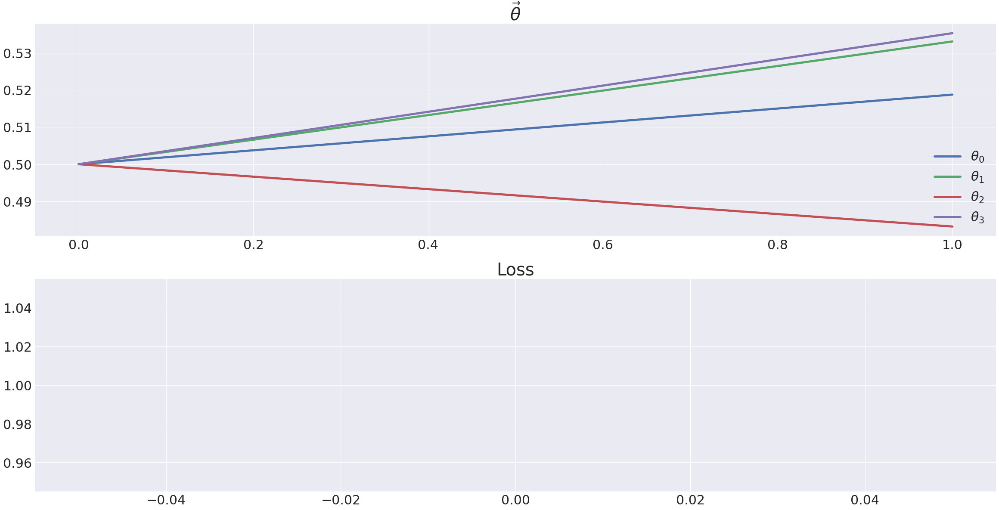

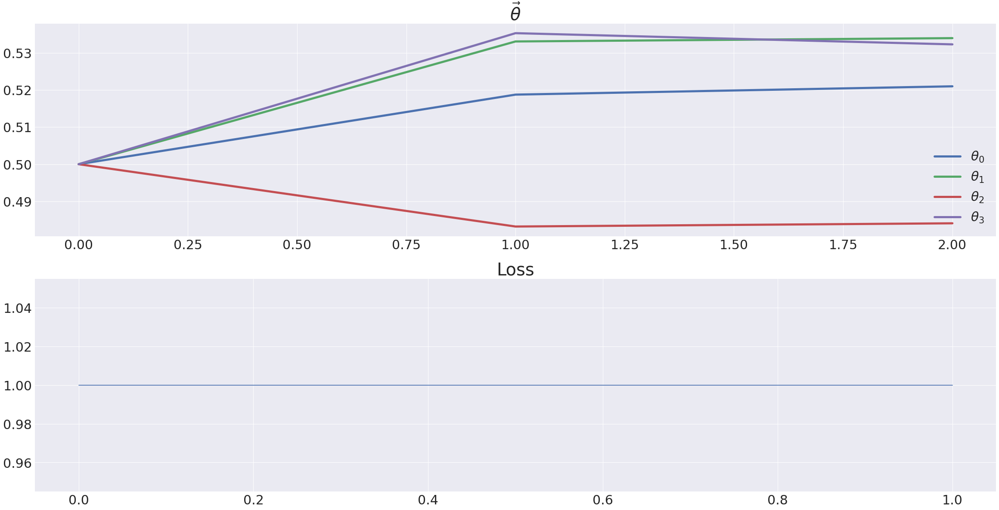

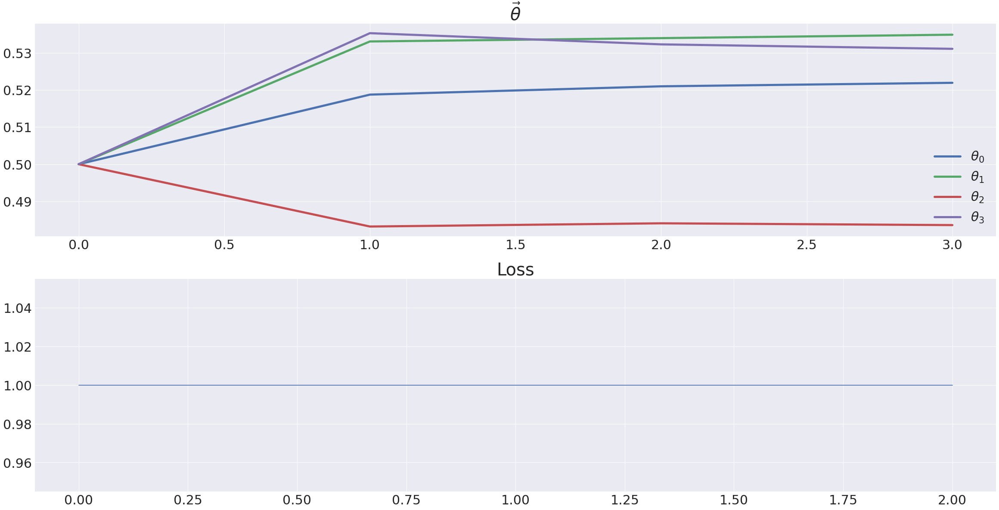

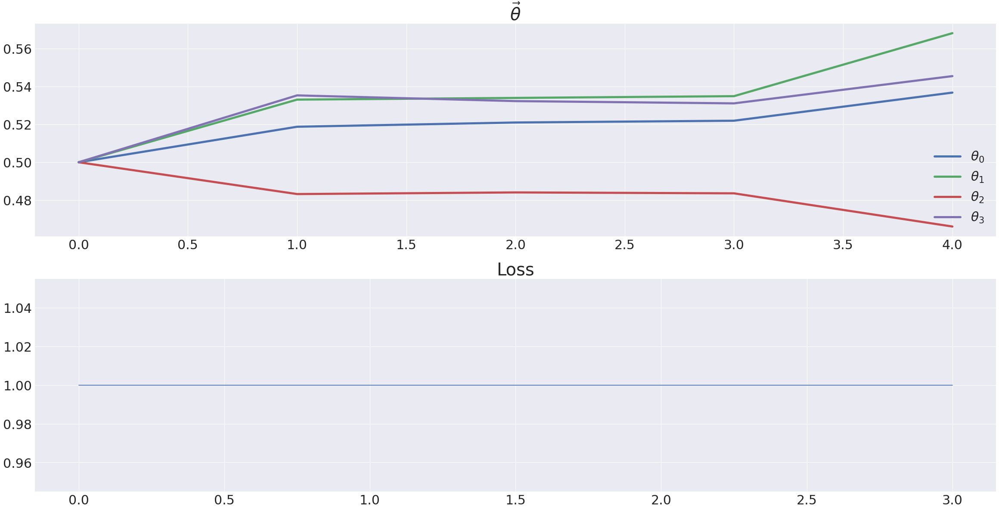

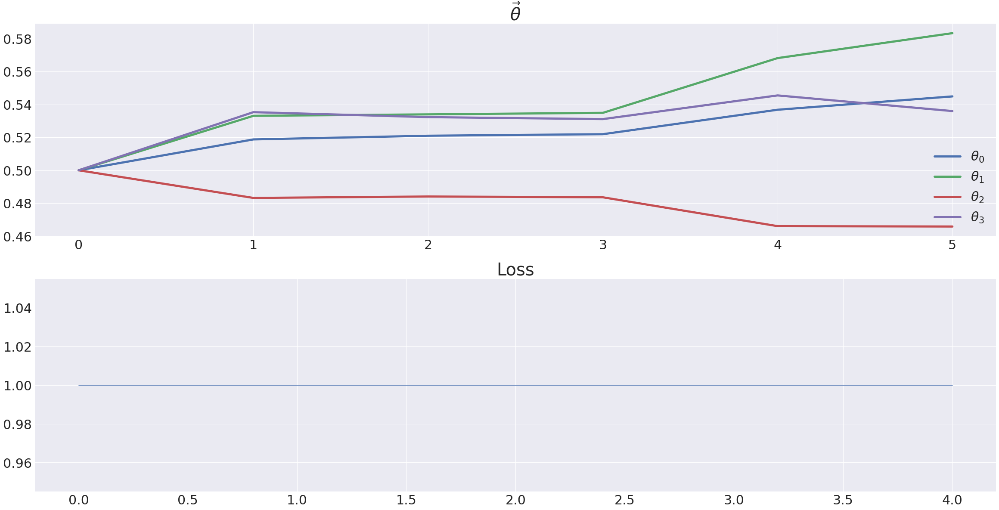

...

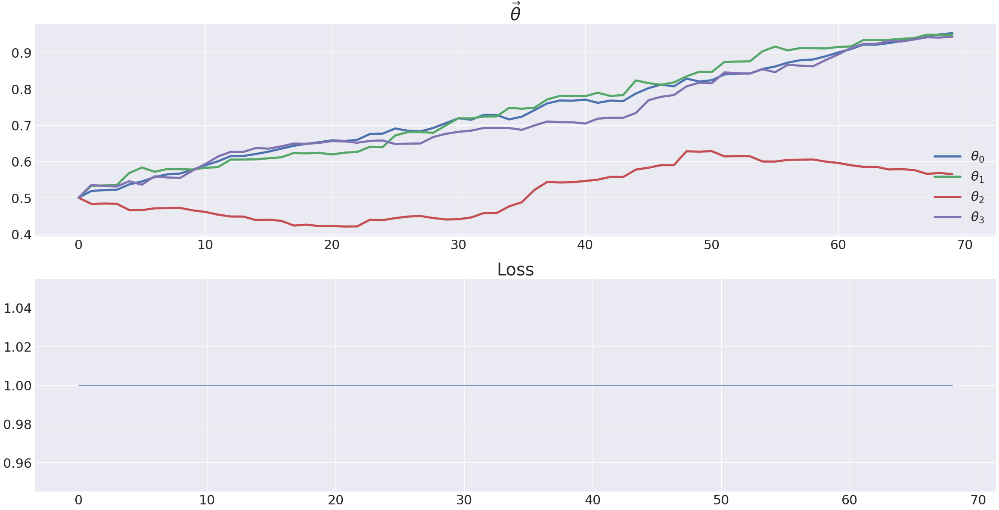

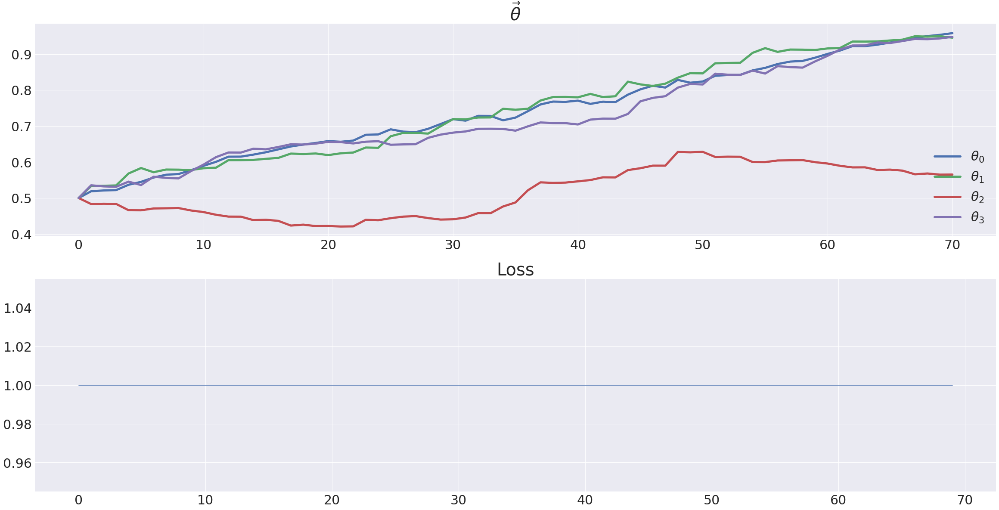

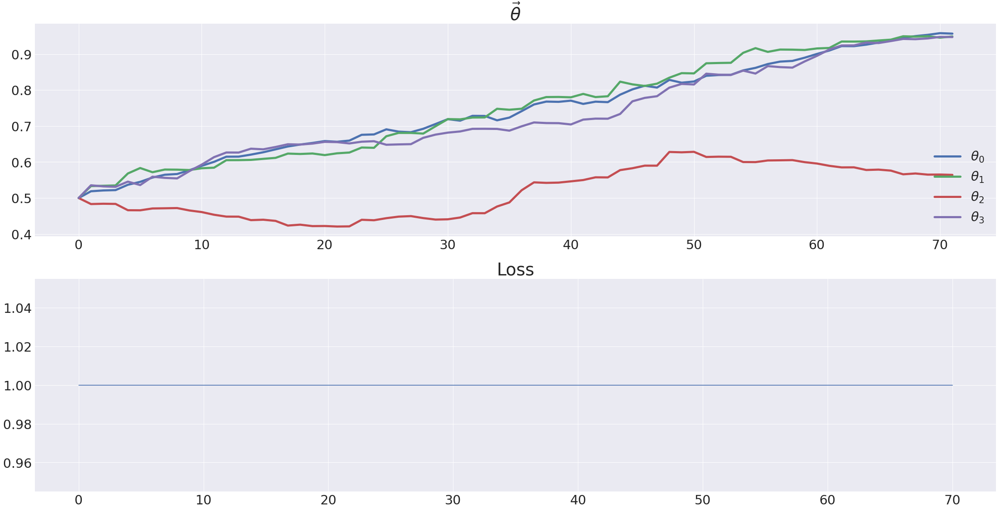

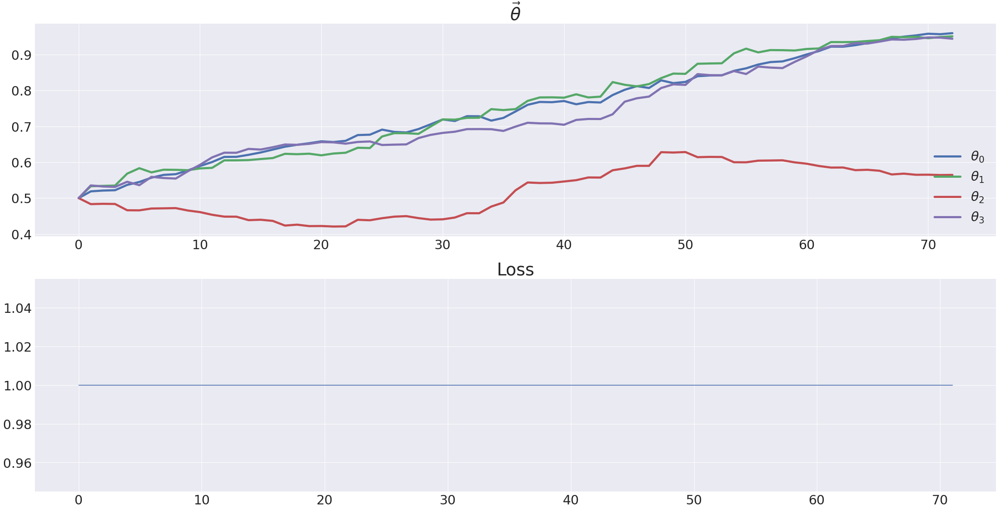

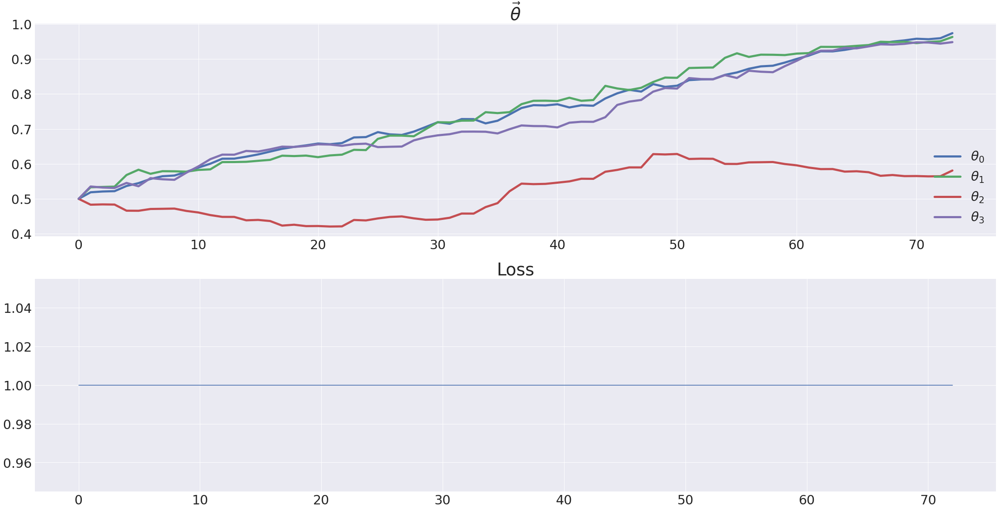

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

class LR_dataset_generator:
    def __init__(self, feature_dim, n_sample = 50, noise = 0):
        self._feature_dim = feature_dim
        self._n_sample = n_sample
        self._noise = noise
        
        self._coefficient_list = None
        self._distribution_params = None
        
        self._dataset = None
        
        self._init_coefficient()
        self._init_distribution_params()
        
    def _init_coefficient(self):
        self._coefficient_list = [0] + [1 for _ in range(self._feature_dim)]
        
    def _init_distribution_params(self):
        self._distribution_params = {f:{'mean':0, 'std':1}
                                     for f in range(1, self._feature_dim+1)}
    
    def make_dataset(self):
        x_data = np.zeros(shape = (self._n_sample, 1))
        y_data = np.zeros(shape = (self._n_sample, 1))
        
        for f_idx in range(1, self._feature_dim + 1):
            feature_data = np.random.normal(loc = self._distribution_params[f_idx]['mean'],
                                            scale = self._distribution_params[f_idx]['std'],
                                            size = (self._n_sample, 1))
            x_data = np.hstack((x_data, feature_data))
            
            y_data += self._coefficient_list[f_idx]*feature_data
        y_data += self._coefficient_list[0]
        
        return x_data, y_data

    def set_n_sample(self, n_sample):
        self._n_sample = n_sample
    
    def set_noise(self, noise):
        self._noise = noise
    
    def set_distribution_params(self, distribution_params):
        for param_key, param_value in distribution_params.items():
            self._distribution_params[param_key] = param_value
    
    def set_coefficient(self, coefficient_list):
        self._coefficient_list = coefficient_list
    

class plus_node:
    def __init__(self):
        self._x, self._y = None, None
        self._z = None
        
    def forward(self, x, y):
        self._x, self._y = x, y
        self._z = self._x + self._y
        return self._z
    
    def backward(self, dz):
        return dz, dz
    
class minus_node:
    def __init__(self):
        self._x, self._y = None, None
        self._z = None
        
    def forward(self, x, y):
        self._x, self._y = x, y
        self._z = self._x - self._y
        return self._z
    
    def backward(self, dz):
        return dz, -1*dz
    
class mul_node:
    def __init__(self):
        self._x, self._y = None, None
        self._z = None
        
    def forward(self, x, y):
        self._x, self._y = x, y
        self._z = self._x * self._y
        return self._z
    
    def backward(self, dz):
        return dz*self._y, dz*self._x
    
class square_node:
    def __init__(self):
        self._x = None
        self._z = None
        
    def forward(self, x):
        self._x = x
        self._z = self._x * self._x
        return self._z
    
    def backward(self, dz):
        return dz*2*self._x
    
class mean_node:
    def __init__(self):
        self._x = None
        self._z = None
        
    def forward(self, x):
        self._x = x
        self._z = np.mean(self._x) 
        return self._z
    
    def backward(self, dz):
        dx = dz*1/len(self._x)*np.ones_like(self._x)
        return dx
    
#------------------------------------------------------------

plt.style.use('seaborn') 
np.random.seed(0)

n_sample = 50
feature_dim = 3
coefficient_list = [3, 3, 3, 3] 
distribution_params = {1:{'mean':0,'std':1}, 2:{'mean':0,'std':1}, 3:{'mean':0,'std':1}}

y_data = np.zeros(shape = (n_sample, 1)) 
x_data = np.zeros(shape = (n_sample, 1))
for feature_idx in range(1, feature_dim + 1):    
    feature_data = np.random.normal(loc = distribution_params[feature_idx]['mean'], 
                                    scale = distribution_params[feature_idx]['std'], 
                                    size = (n_sample, 1))    
    x_data = np.hstack((x_data, feature_data))    
    y_data += coefficient_list[feature_idx]*feature_data

    
y_data += coefficient_list[0] 
#print(x_data.shape, y_data.shape)

node1 = [None] + [mul_node() for _ in range(feature_dim)]
node2 = [None] + [plus_node() for _ in range(feature_dim)]

node3 = minus_node()
node4 = square_node()

th_list = [0.5, 0.5, 0.5, 0.5]
epochs, lr = 2, 0.001

th_accum = np.array(th_list).reshape(-1,1)
loss_list = []

for epoch in range(epochs) :
    for data_idx, (X, y) in enumerate(zip(x_data, y_data)):
        
        z1_1 = node1[1].forward(th_list[1], X[1])
        z1_2 = node1[2].forward(th_list[2], X[2])
        z1_3 = node1[3].forward(th_list[3], X[3])
        
        z2_1 = node2[1].forward(th_list[0], z1_1)
        z2_2 = node2[2].forward(z2_1, z1_2)
        z2_3 = node2[3].forward(z2_2, z1_3)
        
        z3 = node3.forward(y, z2_3)
        l = node4.forward(z3)
        
        dz3 = node4.backward(1)
        dy, dz2_3 = node3.backward(dz3)
        
        dz2_2, dz1_3 = node2[3].backward(dz2_3)
        dz2_1, dz1_2 = node2[2].backward(dz2_2)
        dth0, dz1_1 = node2[1].backward(dz2_1)
        
        dth3, dx3 = node1[3].backward(dz1_3)
        dth2, dx2 = node1[2].backward(dz1_2)
        dth1, dx1 = node1[1].backward(dz1_1)
        
        th_list[3] = th_list[3] - lr*dth3
        th_list[2] = th_list[2] - lr*dth2
        th_list[1] = th_list[1] - lr*dth1
        th_list[0] = th_list[0] - lr*dth0
        
        th_next = np.array(th_list).reshape(-1,1) #column vector로 만들어주기
        th_accum = np.hstack((th_accum, th_next))
        loss_list.append(1)
        
        fig, ax = plt.subplots(2,1, figsize = (40,20))
        for i in range(feature_dim + 1):
            ax[0].plot(th_accum[i], label = r'$\theta_{%d}$'%i, linewidth = 5)
            
        ax[1].plot(loss_list)
        
        ax[0].legend(loc = 'lower right', fontsize = 30)
        ax[0].tick_params(axis = 'both', labelsize = 30)
        ax[1].tick_params(axis = 'both', labelsize = 30)
        
        ax[0].set_title(r'$\vec{\theta}$', fontsize = 40)
        ax[1].set_title(r'Loss', fontsize = 40)